# ECE 228 Unet (ISBI 2013 dataset)

# Python imports

In [1]:
import numpy as np
import os
import sys
from matplotlib import pyplot as plt
%matplotlib inline  

import torch
from torch import nn
from torch.autograd import Variable
from torchvision import transforms, utils
from skimage import io, transform
from skimage.color import rgb2gray

from models import * 
from train import *
from data_loader import * 

from scipy import ndimage

from matplotlib.colors import ListedColormap


# Load data

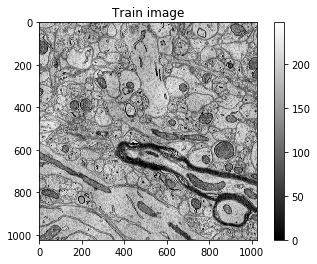

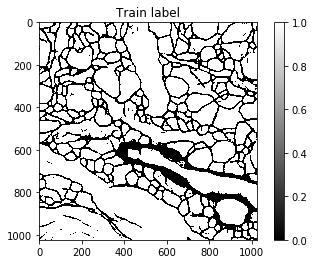

max =  1
min =  0
train_imgs shape =  (100, 1, 1024, 1024)
train_labels shape =  (100, 1, 1024, 1024)


In [2]:
from PIL import Image

resize_size = 512

data_tif = Image.open('datasets/isbi_2013/train-input_snemi3d.tif')
train_imgs = []
i = 0
while True:
    try:
        data_tif.seek(i)
        train_imgs.append(np.array(data_tif))
        #train_imgs.append(transform.resize(np.array(data_tif),(resize_size,resize_size)))

        i += 1
    except EOFError:
        # Not enough frames in img
        break
        
train_imgs = np.array(train_imgs)
train_imgs = np.expand_dims(train_imgs, axis=1)


label_tif = Image.open('datasets/isbi_2013/train-membranes-idsia_snemi3d.tif')
train_labels = []
i = 0
while True:
    try:
        label_tif.seek(i)
        train_labels.append(np.array(label_tif))
        #train_labels.append(transform.resize(np.array(label_tif),(resize_size, resize_size)))

        i += 1
    except EOFError:
        # Not enough frames in img
        break
        
train_labels = np.array(train_labels)
train_labels = np.expand_dims(train_labels, axis=1)

train_labels = (train_labels > 200).astype(np.uint8)

plt.imshow(np.squeeze(train_imgs[0]),cmap="gray")
plt.title("Train image")
plt.colorbar()
plt.show()

plt.imshow(np.squeeze(train_labels[0]), cmap="gray")
plt.title("Train label")
plt.colorbar()
plt.show()


print("max = ",np.max(train_labels))
print("min = ",np.min(train_labels))
#train_imgs = (train_imgs/127)-1
#train_labels = (train_labels/255)






print("train_imgs shape = ",train_imgs.shape)
print("train_labels shape = ",train_labels.shape)






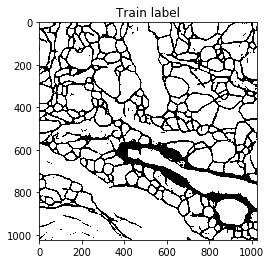

In [3]:
plt.imshow(np.squeeze(train_labels[0] ), cmap="gray")
plt.title("Train label")
#plt.colorbar()
plt.show()

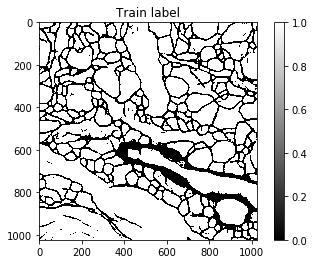

In [4]:
plt.imshow((np.squeeze(train_labels[0])>0.95).astype(np.uint8), cmap="gray")
plt.title("Train label")
plt.colorbar()
plt.show()

# Run Training

GPU is enabled 
80/20 training/validation split
total_train_size =  100
val_size =  20
y train shape =  (80, 1024, 1024)
y train shape =  (20, 1024, 1024)
training image from batch 0


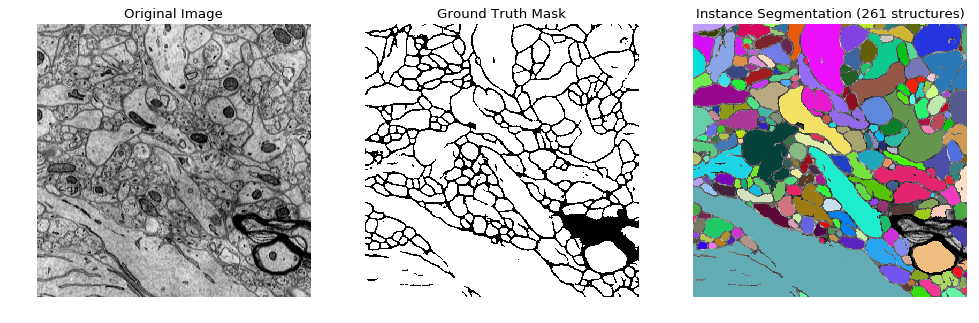

training image from batch 1


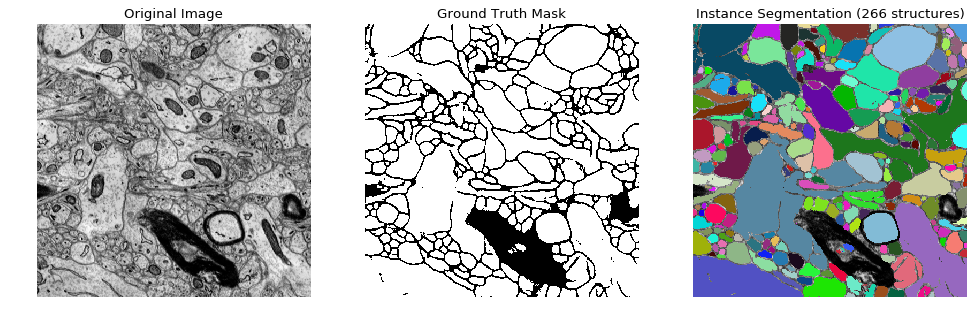

training image from batch 2


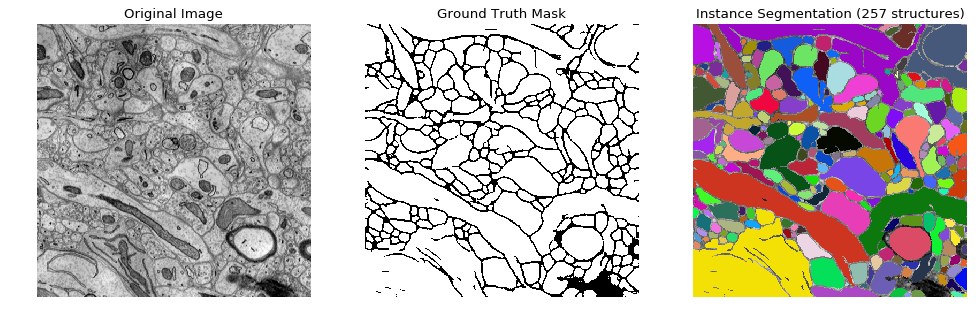

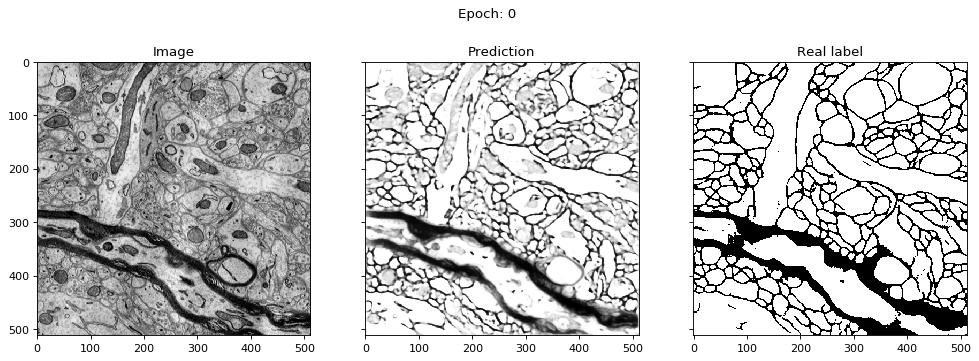

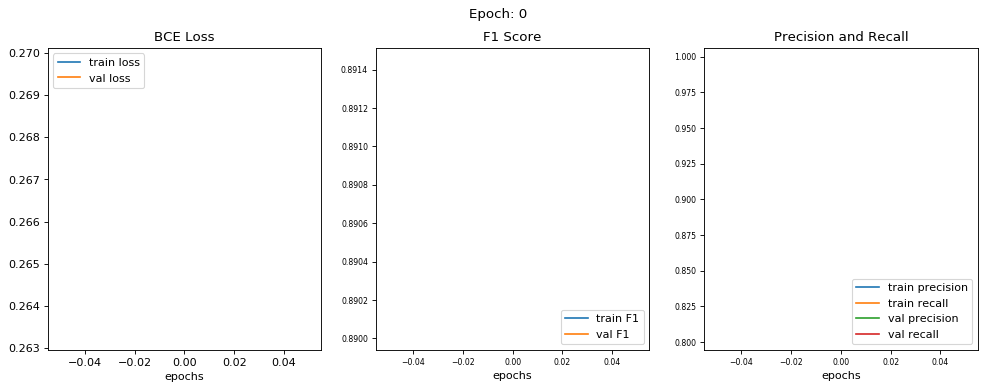

epoch [0/100] 
train loss = 0.2633, train f1 score = 0.8914 
train precision = 0.8066, train recall = 0.9967 

val loss = 0.2698, val f1 score = 0.8900 
val precision = 0.8042, val recall = 0.9967 




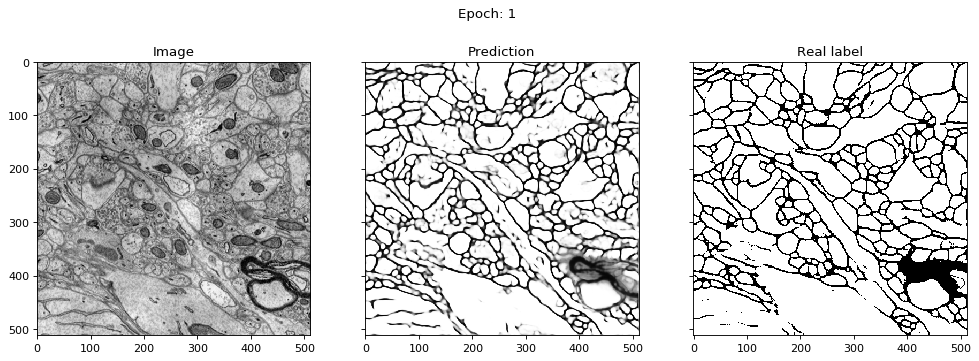

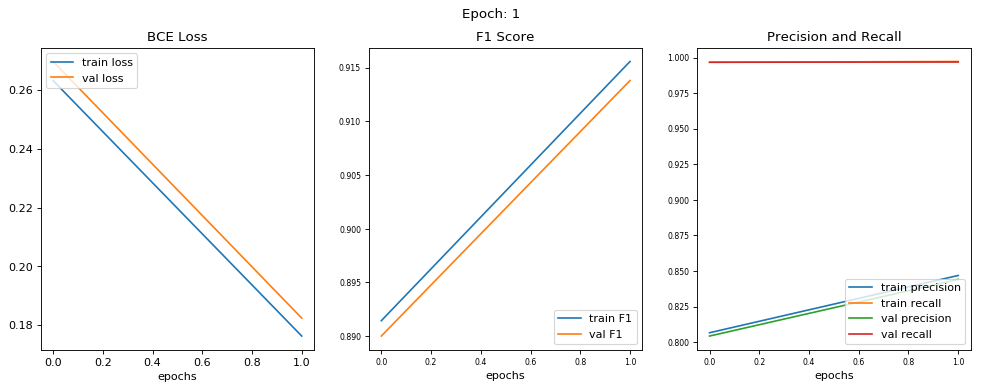

epoch [1/100] 
train loss = 0.1763, train f1 score = 0.9156 
train precision = 0.8468, train recall = 0.9972 

val loss = 0.1824, val f1 score = 0.9138 
val precision = 0.8441, val recall = 0.9969 




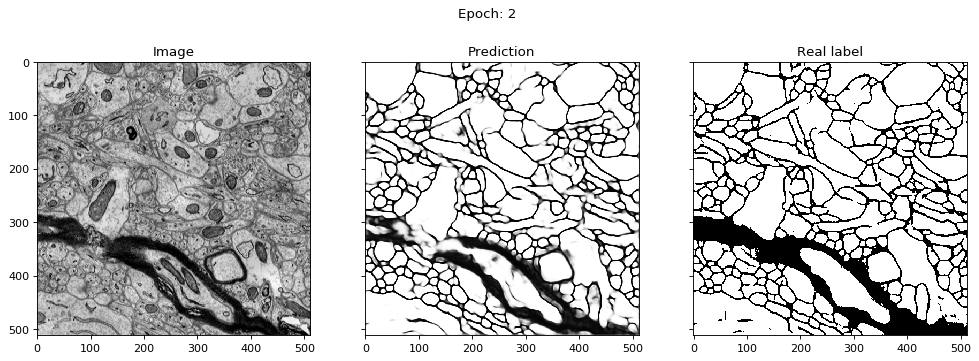

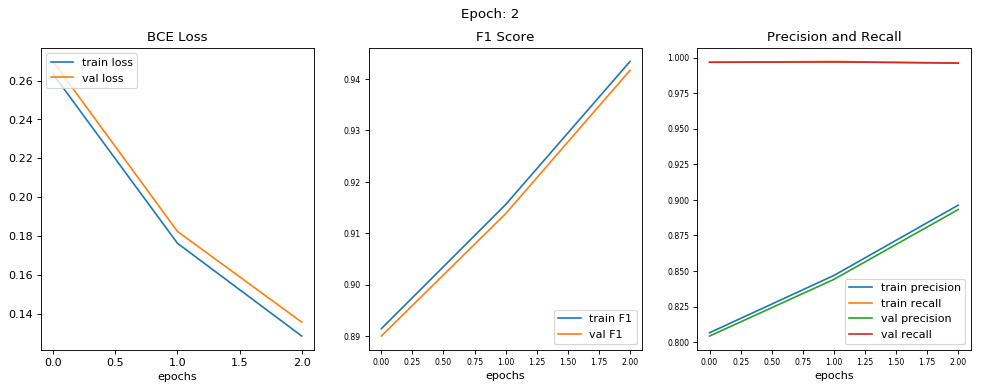

epoch [2/100] 
train loss = 0.1285, train f1 score = 0.9434 
train precision = 0.8962, train recall = 0.9961 

val loss = 0.1356, val f1 score = 0.9417 
val precision = 0.8931, val recall = 0.9961 




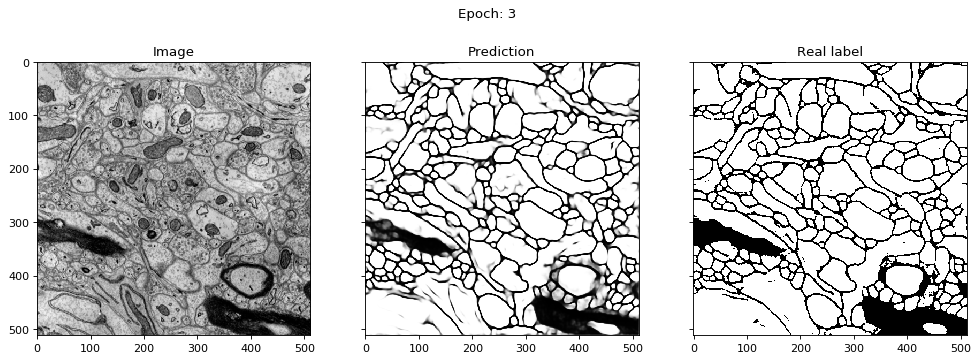

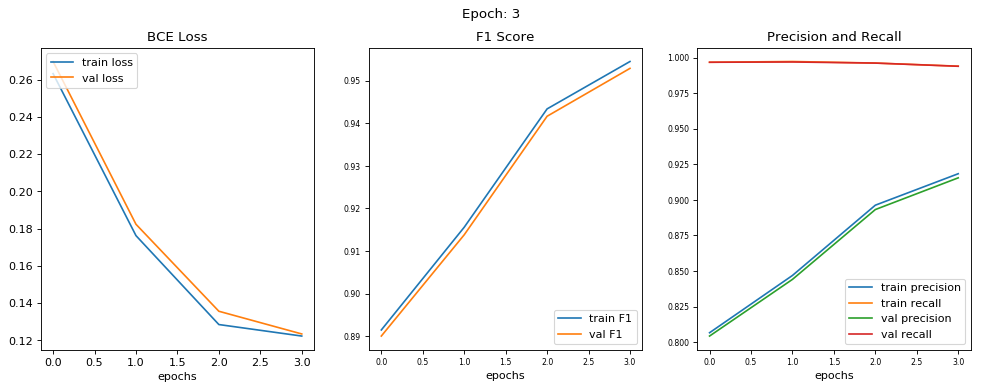

epoch [3/100] 
train loss = 0.1223, train f1 score = 0.9545 
train precision = 0.9183, train recall = 0.9939 

val loss = 0.1234, val f1 score = 0.9529 
val precision = 0.9154, val recall = 0.9938 




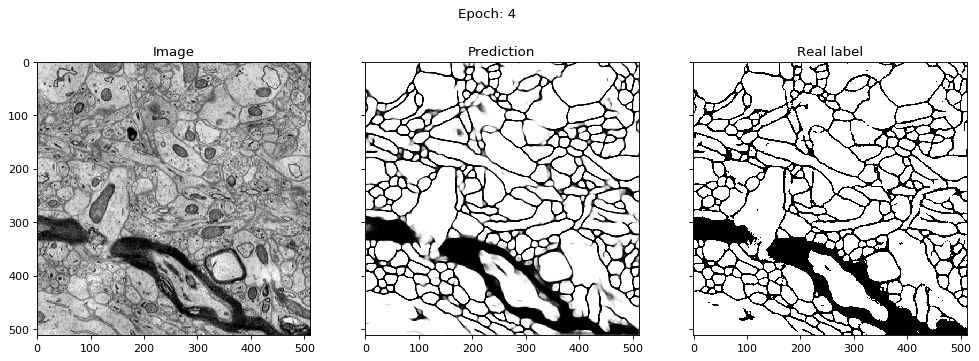

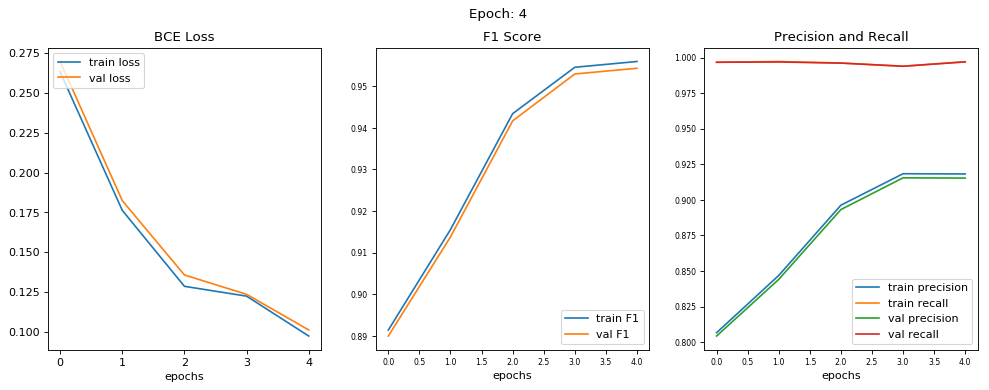

epoch [4/100] 
train loss = 0.0972, train f1 score = 0.9559 
train precision = 0.9182, train recall = 0.9970 

val loss = 0.1011, val f1 score = 0.9543 
val precision = 0.9153, val recall = 0.9969 




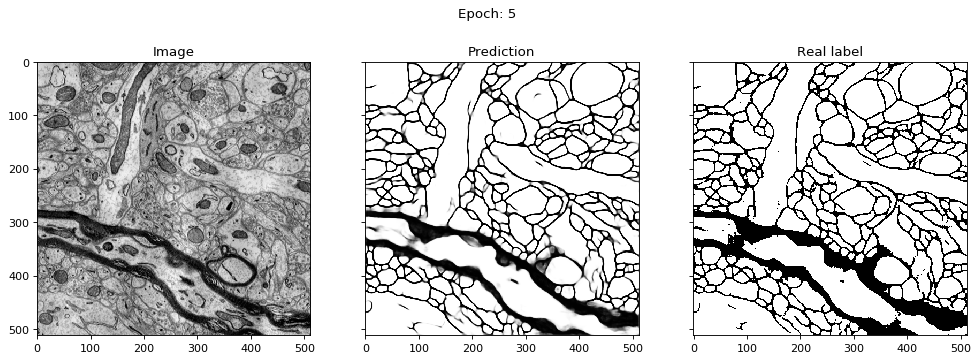

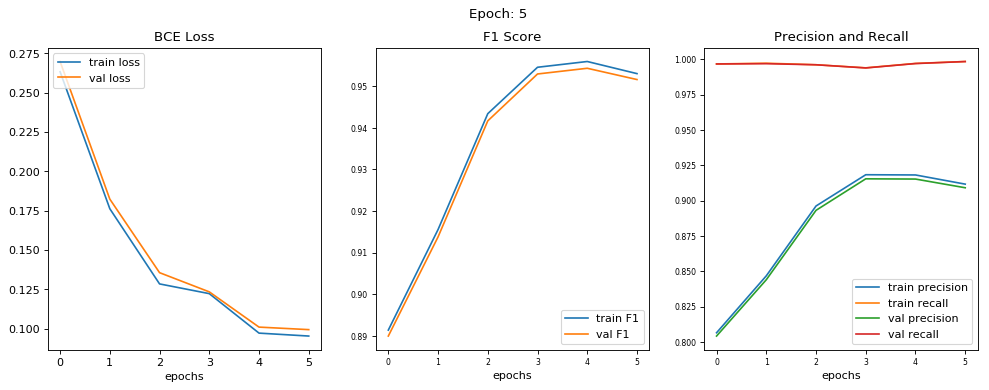

epoch [5/100] 
train loss = 0.0954, train f1 score = 0.9530 
train precision = 0.9117, train recall = 0.9984 

val loss = 0.0995, val f1 score = 0.9516 
val precision = 0.9091, val recall = 0.9984 




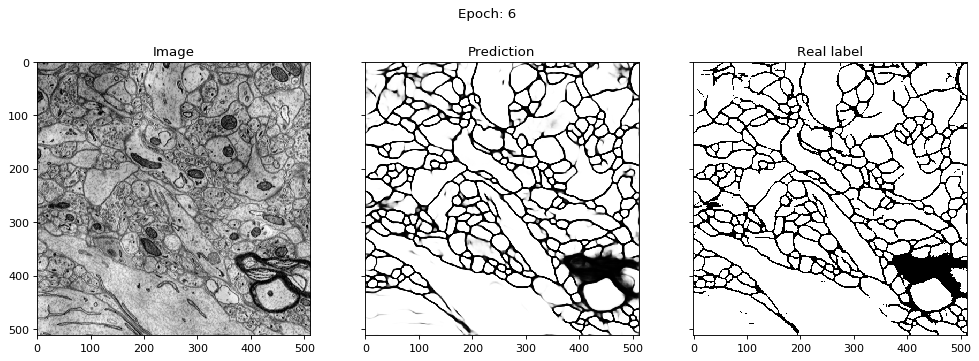

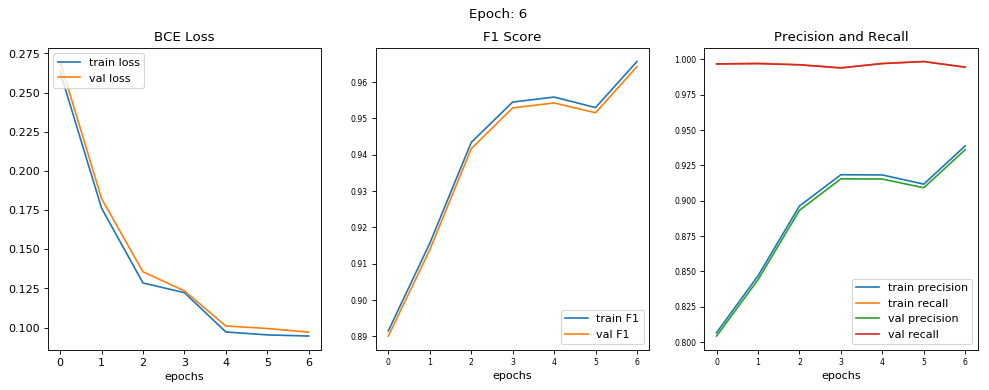

epoch [6/100] 
train loss = 0.0946, train f1 score = 0.9657 
train precision = 0.9387, train recall = 0.9944 

val loss = 0.0972, val f1 score = 0.9643 
val precision = 0.9360, val recall = 0.9944 




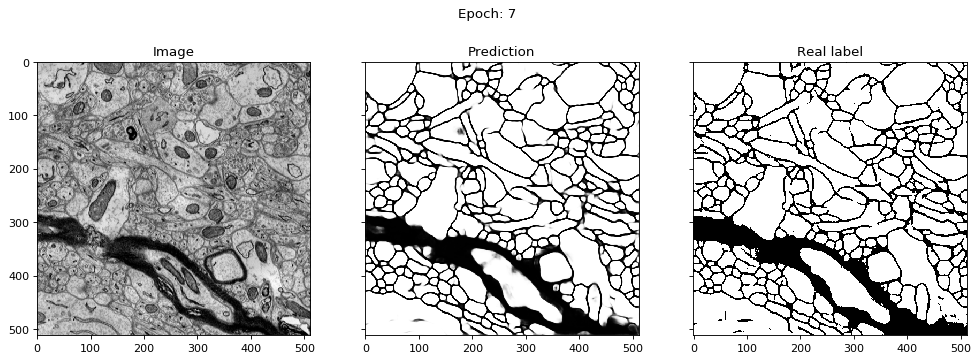

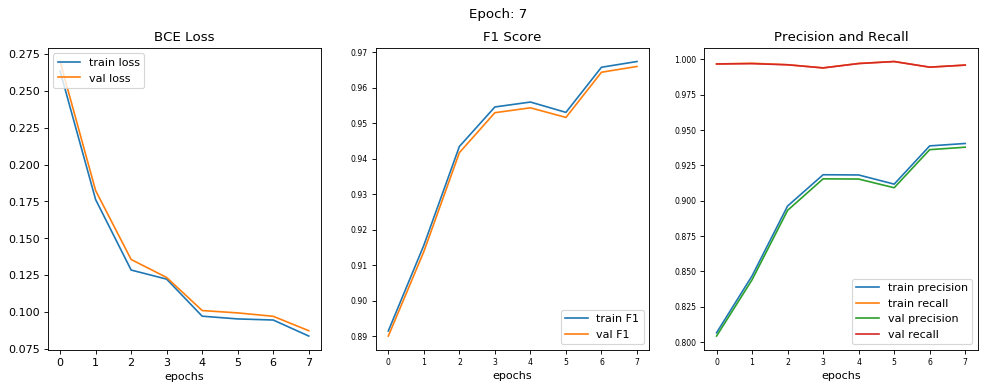

epoch [7/100] 
train loss = 0.0838, train f1 score = 0.9673 
train precision = 0.9404, train recall = 0.9959 

val loss = 0.0874, val f1 score = 0.9659 
val precision = 0.9378, val recall = 0.9959 




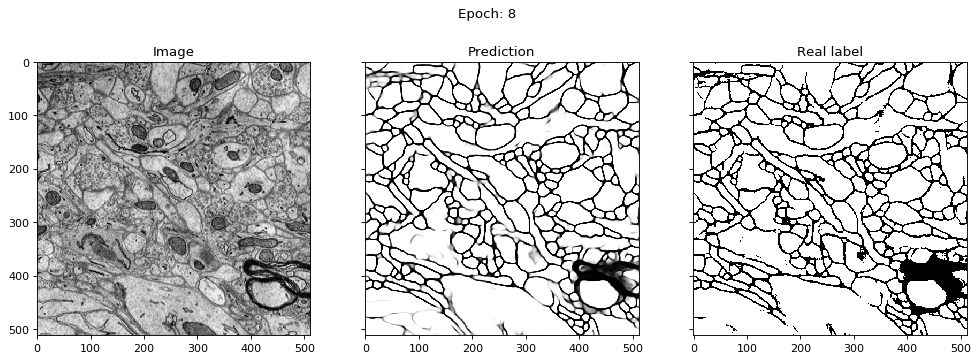

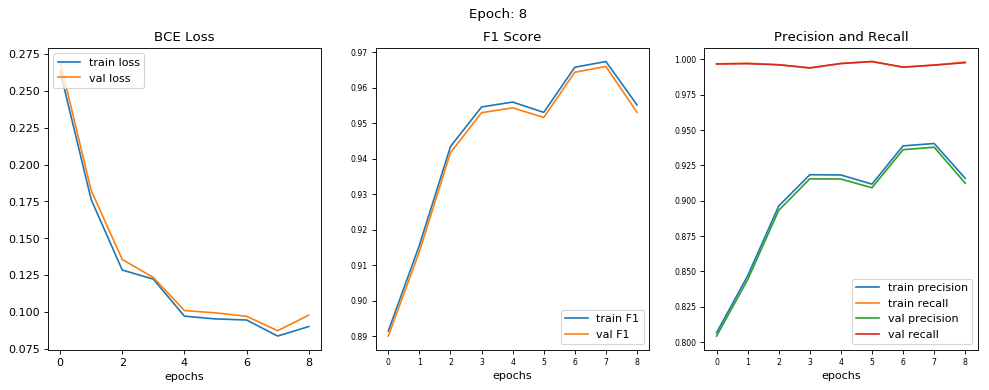

epoch [8/100] 
train loss = 0.0902, train f1 score = 0.9551 
train precision = 0.9158, train recall = 0.9980 

val loss = 0.0979, val f1 score = 0.9530 
val precision = 0.9124, val recall = 0.9976 




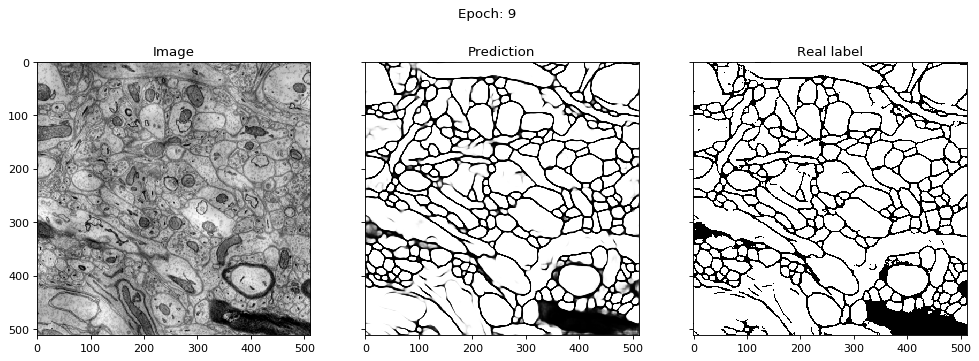

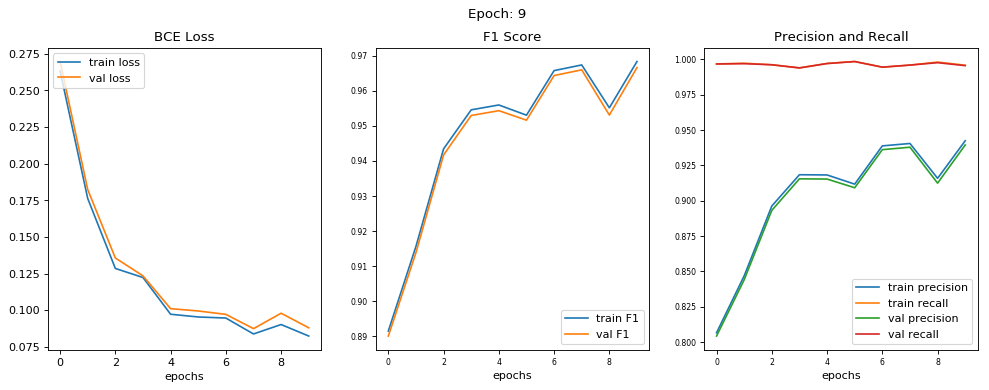

epoch [9/100] 
train loss = 0.0823, train f1 score = 0.9683 
train precision = 0.9423, train recall = 0.9958 

val loss = 0.0880, val f1 score = 0.9666 
val precision = 0.9394, val recall = 0.9955 




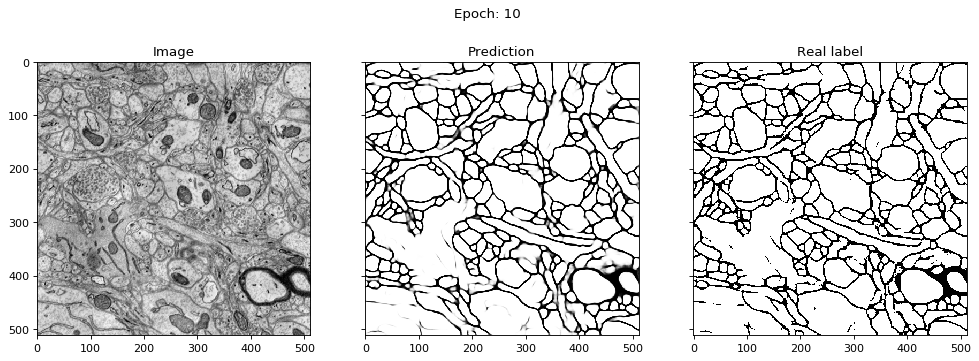

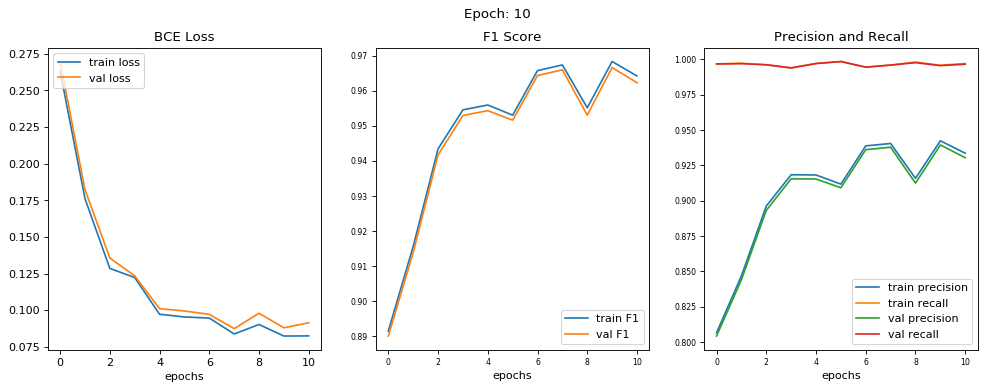

epoch [10/100] 
train loss = 0.0825, train f1 score = 0.9642 
train precision = 0.9335, train recall = 0.9970 

val loss = 0.0914, val f1 score = 0.9623 
val precision = 0.9304, val recall = 0.9965 




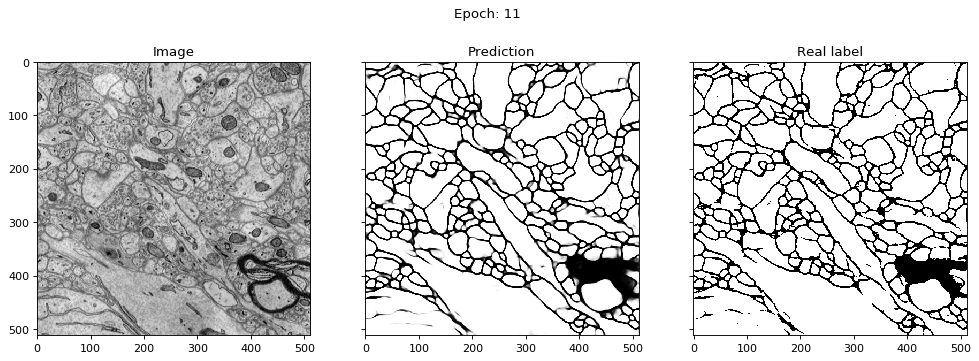

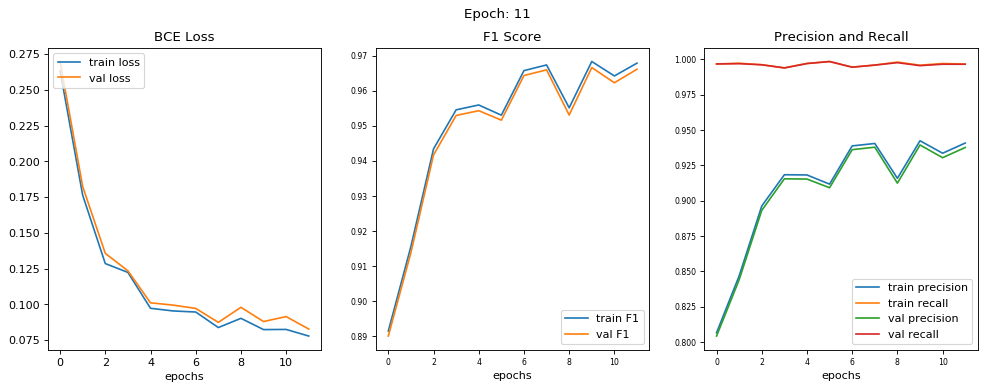

epoch [11/100] 
train loss = 0.0778, train f1 score = 0.9678 
train precision = 0.9407, train recall = 0.9966 

val loss = 0.0827, val f1 score = 0.9661 
val precision = 0.9376, val recall = 0.9964 




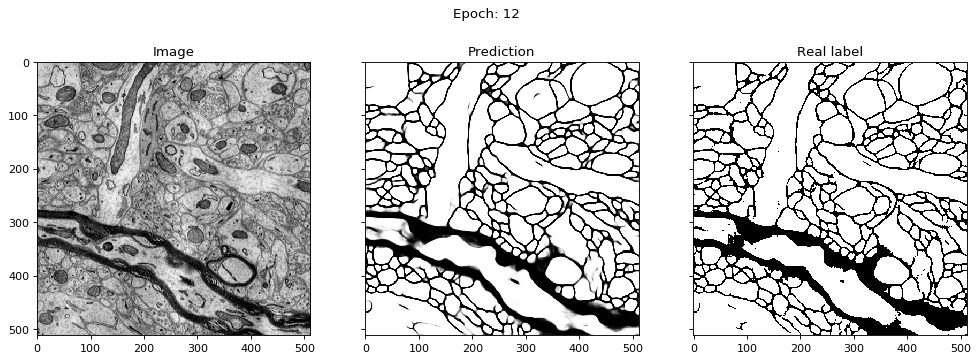

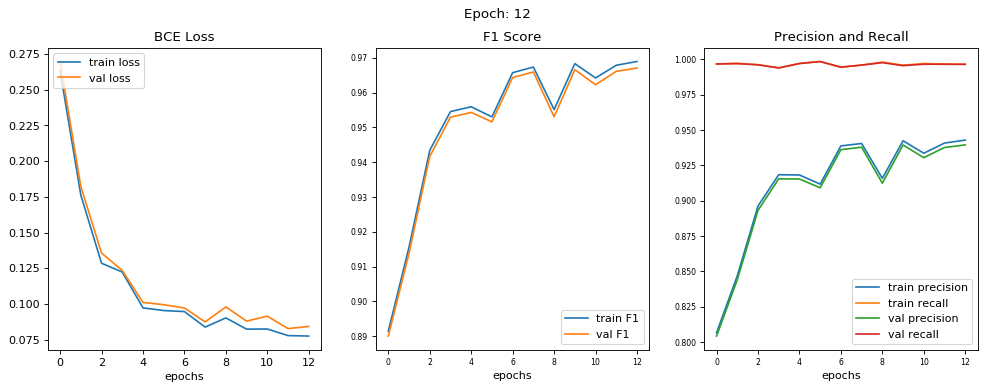

epoch [12/100] 
train loss = 0.0775, train f1 score = 0.9689 
train precision = 0.9428, train recall = 0.9965 

val loss = 0.0842, val f1 score = 0.9670 
val precision = 0.9394, val recall = 0.9964 




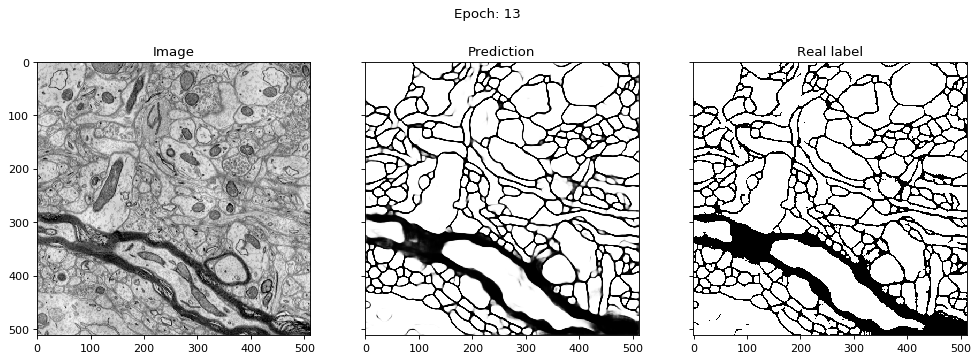

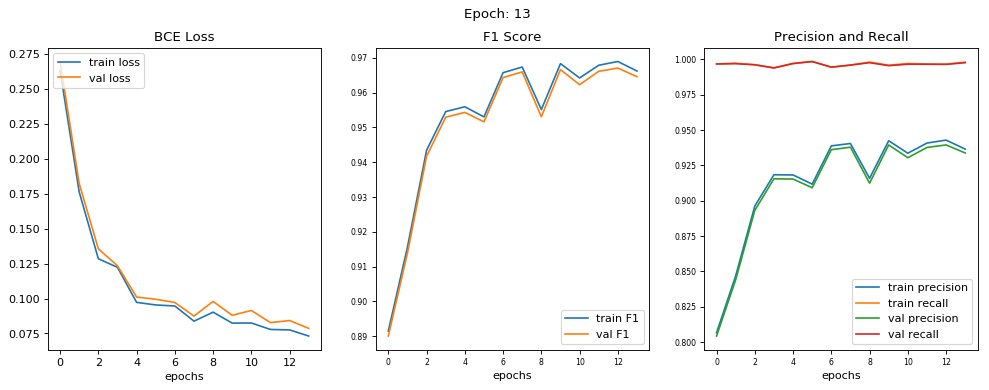

epoch [13/100] 
train loss = 0.0731, train f1 score = 0.9662 
train precision = 0.9364, train recall = 0.9979 

val loss = 0.0786, val f1 score = 0.9646 
val precision = 0.9337, val recall = 0.9976 




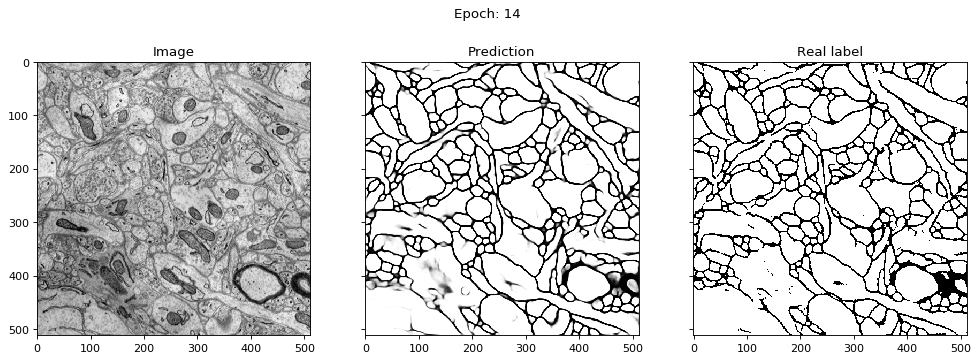

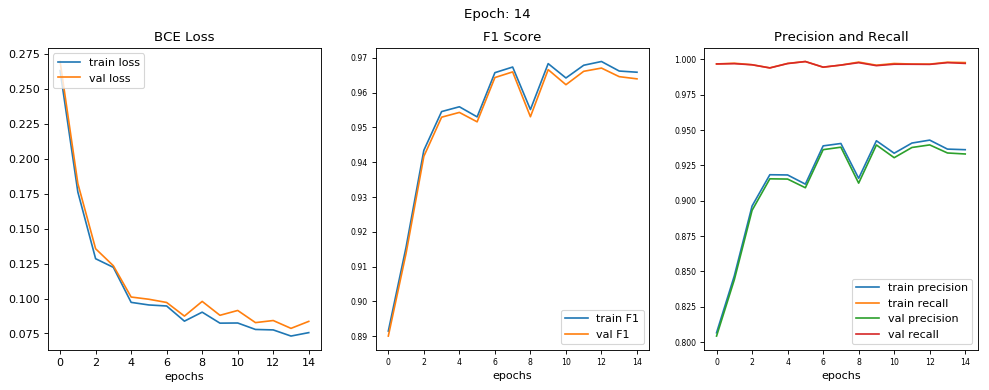

epoch [14/100] 
train loss = 0.0756, train f1 score = 0.9658 
train precision = 0.9360, train recall = 0.9976 

val loss = 0.0836, val f1 score = 0.9639 
val precision = 0.9330, val recall = 0.9971 




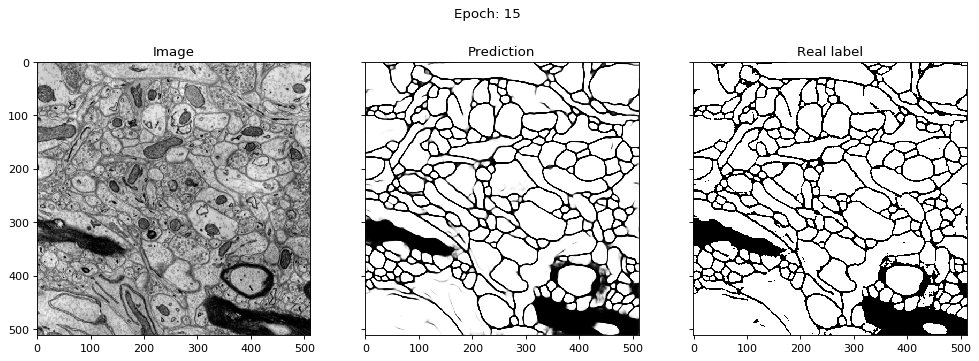

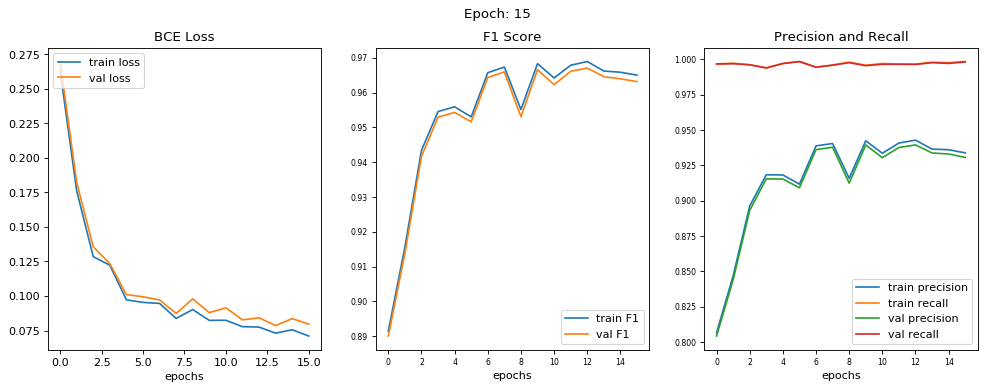

epoch [15/100] 
train loss = 0.0710, train f1 score = 0.9650 
train precision = 0.9338, train recall = 0.9984 

val loss = 0.0797, val f1 score = 0.9631 
val precision = 0.9306, val recall = 0.9981 




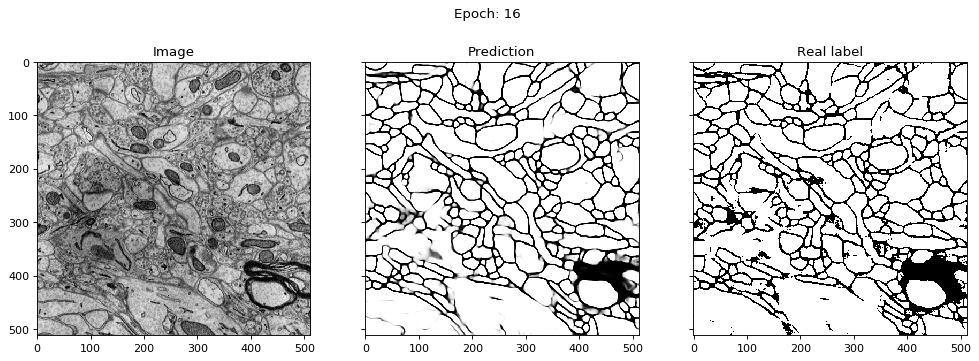

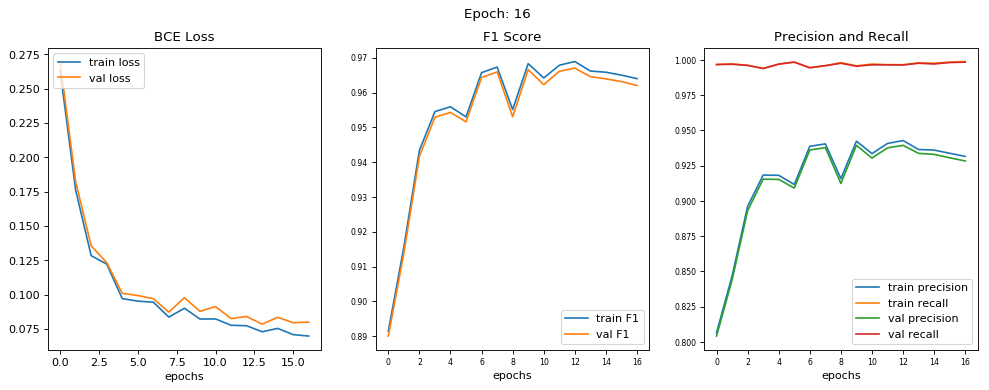

epoch [16/100] 
train loss = 0.0700, train f1 score = 0.9640 
train precision = 0.9315, train recall = 0.9988 

val loss = 0.0801, val f1 score = 0.9620 
val precision = 0.9283, val recall = 0.9983 




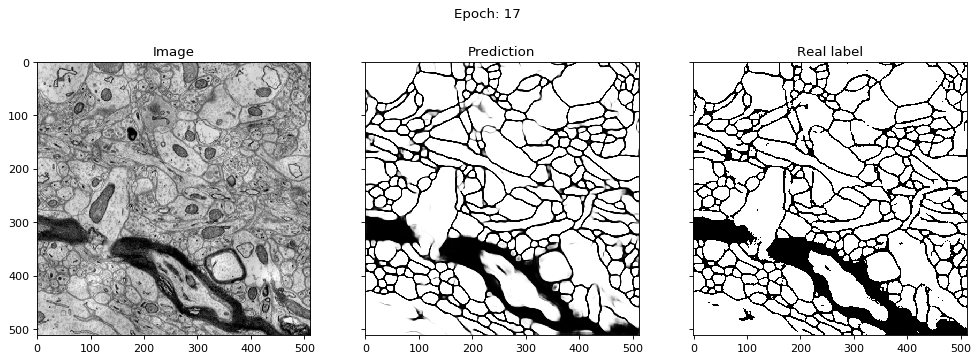

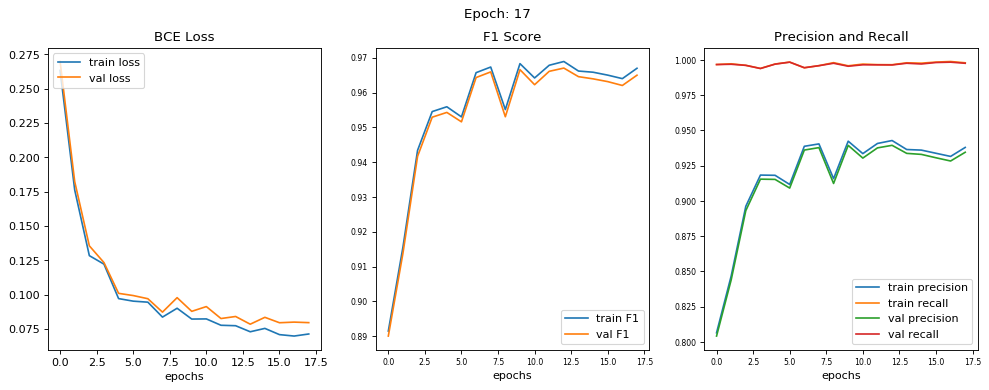

epoch [17/100] 
train loss = 0.0715, train f1 score = 0.9670 
train precision = 0.9379, train recall = 0.9979 

val loss = 0.0797, val f1 score = 0.9650 
val precision = 0.9345, val recall = 0.9976 




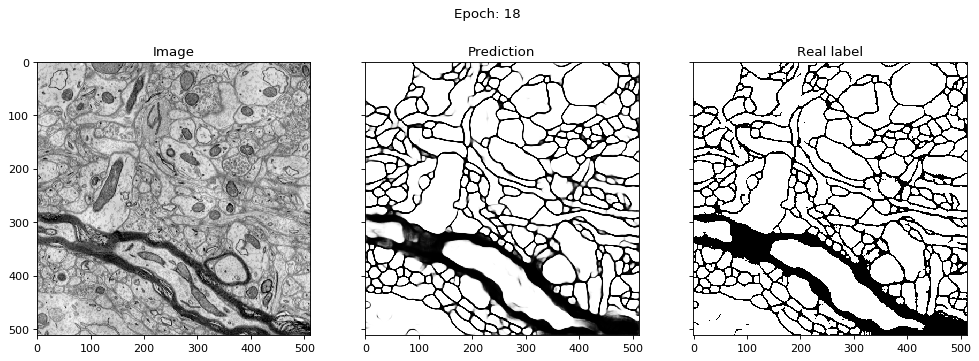

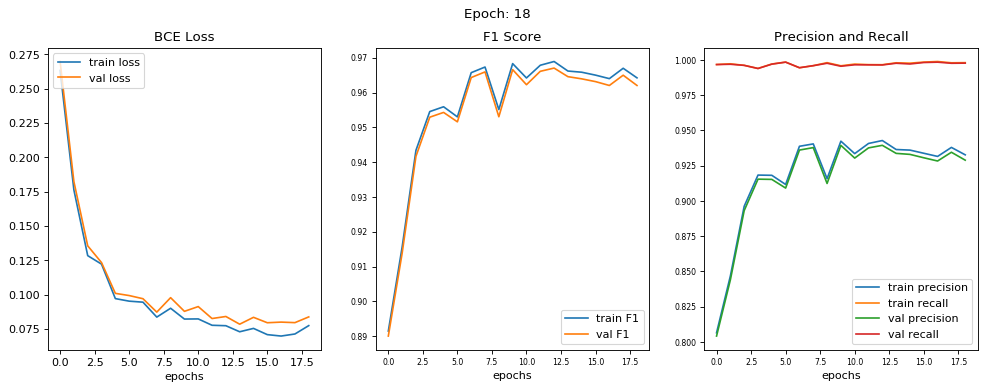

epoch [18/100] 
train loss = 0.0776, train f1 score = 0.9642 
train precision = 0.9327, train recall = 0.9980 

val loss = 0.0839, val f1 score = 0.9620 
val precision = 0.9289, val recall = 0.9977 




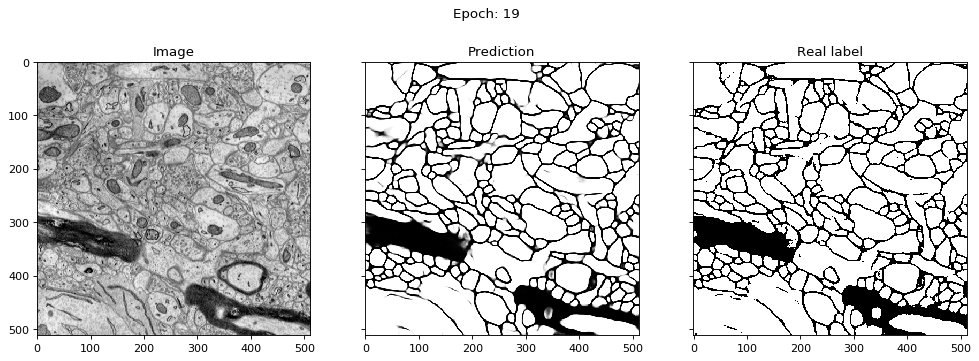

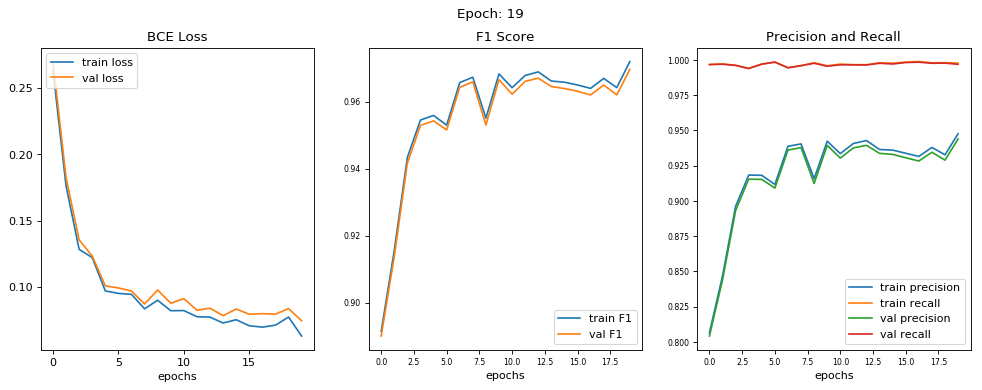

epoch [19/100] 
train loss = 0.0633, train f1 score = 0.9720 
train precision = 0.9476, train recall = 0.9977 

val loss = 0.0748, val f1 score = 0.9697 
val precision = 0.9440, val recall = 0.9968 




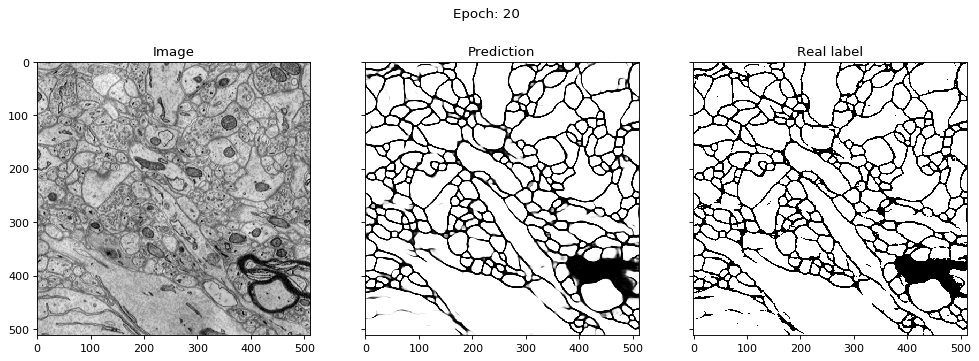

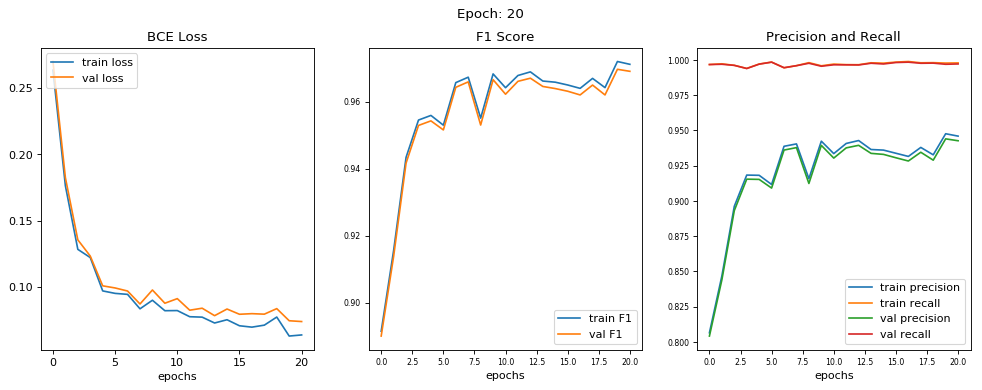

epoch [20/100] 
train loss = 0.0641, train f1 score = 0.9712 
train precision = 0.9459, train recall = 0.9978 

val loss = 0.0742, val f1 score = 0.9691 
val precision = 0.9427, val recall = 0.9971 




In [ ]:
# Prep GPU
GPU = torch.cuda.is_available()
print("GPU is {}enabled ".format(['not ', ''][GPU]))

batch_size = 1
n_epochs = 100


#unet(n_channels, n_classes, n_filters_start=64 )
un = unet(1,1)
if GPU: 
    un = un.cuda()

optimizer = torch.optim.Adam(un.parameters(), lr=0.01)
criterion = nn.BCELoss()




# split into training and validation set 
total_train_size = train_imgs.shape[0]
p = np.random.permutation(total_train_size)
train_imgs = train_imgs[p]
train_labels = train_labels[p]

val_size = int(0.2*total_train_size)

val_imgs = train_imgs[:val_size]
val_labels = train_labels[:val_size]

train_imgs = train_imgs[val_size:]
train_labels = train_labels[val_size:]

print("80/20 training/validation split")
print("total_train_size = ",total_train_size)
print("val_size = ", val_size)


# traning set

img_resize = 512
TrainDataset = Array_Dataset(train_imgs, train_labels, img_resize)
TrainDataLoader = DataLoader(TrainDataset,
                             batch_size=batch_size,
                             shuffle=True,
                             num_workers=4)

# validation set 
ValDataset = Array_Dataset(val_imgs, val_labels, img_resize, do_transform=False)
ValDataLoader = DataLoader(ValDataset,
                             batch_size=1,
                             shuffle=True,
                             num_workers=4)

for i, data in enumerate(TrainDataLoader):

        print("training image from batch %d" % i)
        
    

        imgs = np.array(data[0])
        labels = data[1]
       
        mask, nlabels = ndimage.label(labels[0])

        
        rand_cmap = ListedColormap(np.random.rand(256,3))

        labels_for_display = np.where(mask > 0, mask, np.nan)

        f, (ax1,ax2,ax3) = plt.subplots(1,3, sharey=True,figsize=(15,5), dpi=80)

        #original = (np.squeeze(imgs[0])+1)*127.0
        original = np.squeeze(imgs[0])
        

        ax1.imshow(original, cmap="gray")
        ax1.set_title("Original Image")
        ax1.axis('off')
        
        ax2.imshow(np.squeeze(labels[0]), cmap="gray")
        ax2.set_title("Ground Truth Mask")
        ax2.axis('off')
        
        ax3.imshow(original, cmap="gray")
        ax3.imshow(np.squeeze(labels_for_display), cmap=rand_cmap)
        ax3.set_title("Instance Segmentation (%d structures)"% nlabels)
        ax3.axis('off')
        

        plt.show()
        
        if i > 1: 
            break



output_dir = "./isbi2013_output/"
# run training 
#training(GPU, un,train_imgs, train_labels, val_imgs, val_labels, optimizer, criterion, n_epochs, batch_size)
training(GPU, TrainDataLoader, ValDataLoader, ValDataset, un, optimizer, criterion, n_epochs, batch_size, output_dir, warm_start=False)




In [ ]:

print(count_parameters(model))